<a href="https://colab.research.google.com/github/praths007/machine_learning_intuition/blob/master/logisitic_regression_intuition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Understanding logistic regression using gradient descent**

In [10]:
rm(list = ls())

### caret only used for stratified random sampling
library(caret)


### loading dataset
############################################
iris_data = iris[which(iris$Species %in% c("setosa", "versicolor")),]
iris_data$Species = ifelse(iris_data$Species == "setosa", 1, 0)

### adding X intercept to the data
iris_data$intercept = 1

iris_data = cbind(intercept = iris_data$intercept, 
                  iris_data[,c("Petal.Length", "Petal.Width",  "Species")])

index = unlist(createDataPartition(iris_data$Species,p =  0.7))

train_x = as.matrix(iris_data[index,c("intercept", "Petal.Length", "Petal.Width")])
train_y = as.matrix(iris_data[index,c("Species")])

test_x = as.matrix(iris_data[-index, c("intercept", "Petal.Length", "Petal.Width")])
test_y = as.matrix(iris_data[-index, c("Species")])

nrow(train_x)
nrow(test_x)

[1] 70

[1] 30

In [0]:
############################################

### defining required functions
############################################

squared_error_cost = function(y, yhat){
  return((1 / nrow(y)) * sum((y - yhat)^2))}

## evaluation metric/ cost function logloss is used for classification
## https://datawookie.netlify.com/blog/2015/12/making-sense-of-logarithmic-loss/
logloss_cost = function(y, yhat){
  return(-(1 / nrow(y)) * sum((y*log(yhat) + (1 - y)*log(1 - yhat))))}

## activation function - used to limit values between 0 and 1
sigmoid = function(x){
  return(1 / (1 + 2.71^-x))}
############################################

Warning message:
“glm.fit: algorithm did not converge”Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”

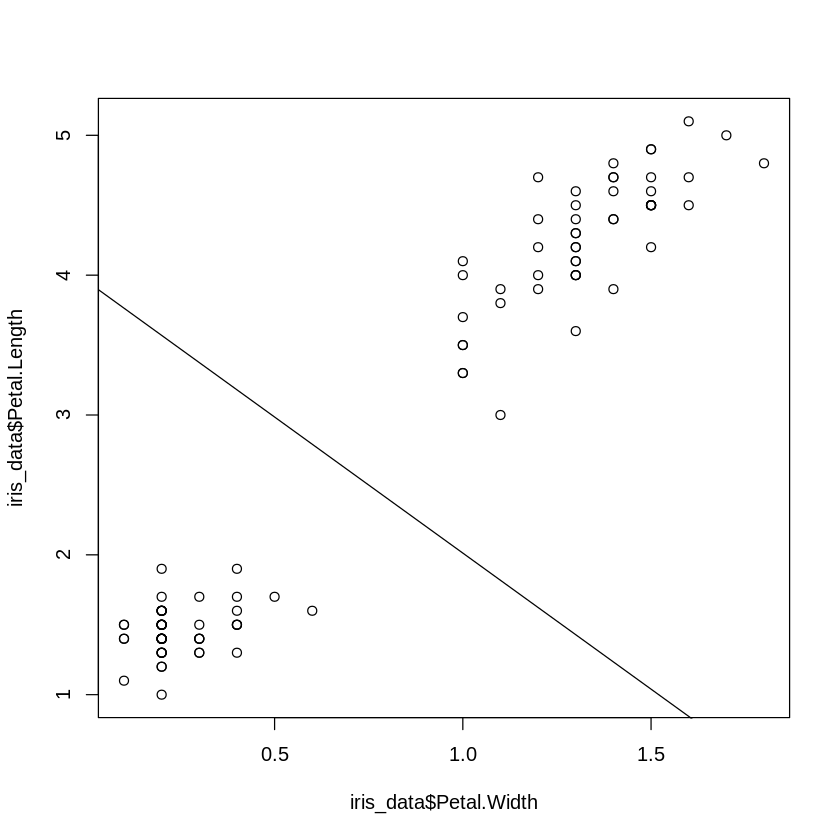

In [13]:
## Plotting decision boundary for dataset
## with base glm logit regression
############################################
plot(iris_data$Petal.Width, iris_data$Petal.Length)
reg=glm(Species ~ Petal.Width + Petal.Length, data = iris_data,
         family='binomial')

## this should be of form y = mx + c
# https://stats.stackexchange.com/questions/6206/how-to-plot-decision-boundary-in-r-for-logistic-regression-model/159977
slope = coef(reg)[2]/(-coef(reg)[3])
intercept = coef(reg)[1]/(-coef(reg)[3]) 

abline(intercept, slope)
############################################


In [14]:
#### Logistic regression intuition
################################################

# 1. initialize theta params
init_theta = as.matrix(c(0, 0.5, 0.5), 1)

# multiply X * theta
z1 = train_x %*% c(t(init_theta))

# predicted value = sigmoid(X * theta)
hthetax = mapply(sigmoid, z1)



###
## cost function
# J(theta) = -{1/ n * sum(y*log(hthetax) + (1 - y)log(1 - hthetax))}
#
# calculate cost
logloss_cost(train_y, hthetax)


## partial derivative of cost function = 
#                 rate of change of cost function wrt change in theta
# https://stats.stackexchange.com/questions/261692/gradient-descent-for-logistic-regression-partial-derivative-doubt
#   d/d(hthetax) = -{y/hthetax - [1/1-hthetax - y/1-hthetax]} * d hthetax /d(hethetax)
#               = -{y/hethetax - [1-y/1-hthetax]}*x
#               = -{y(1-hethtax) - (1-y)hthetax} * x
#               = -{y - yhthetax - hethetax + yhthetax} *x
#               = -(y - hthetax)*x
#               = (hthetax - y)*x

## gradient calculation
alpha = 0.01
theta_iter = alpha/nrow(train_x) * (t(train_x) %*% c(hthetax - train_y))

## updating gradient
init_theta = init_theta - theta_iter
init_theta

# rest of this can be repeated. next section shows gradient descent
# which is repeating all steps given above to optimize for cost (minimize it)


[1] 1.613674

intercept,-0.003207541
Petal.Length,0.481920093
Petal.Width,0.494042533


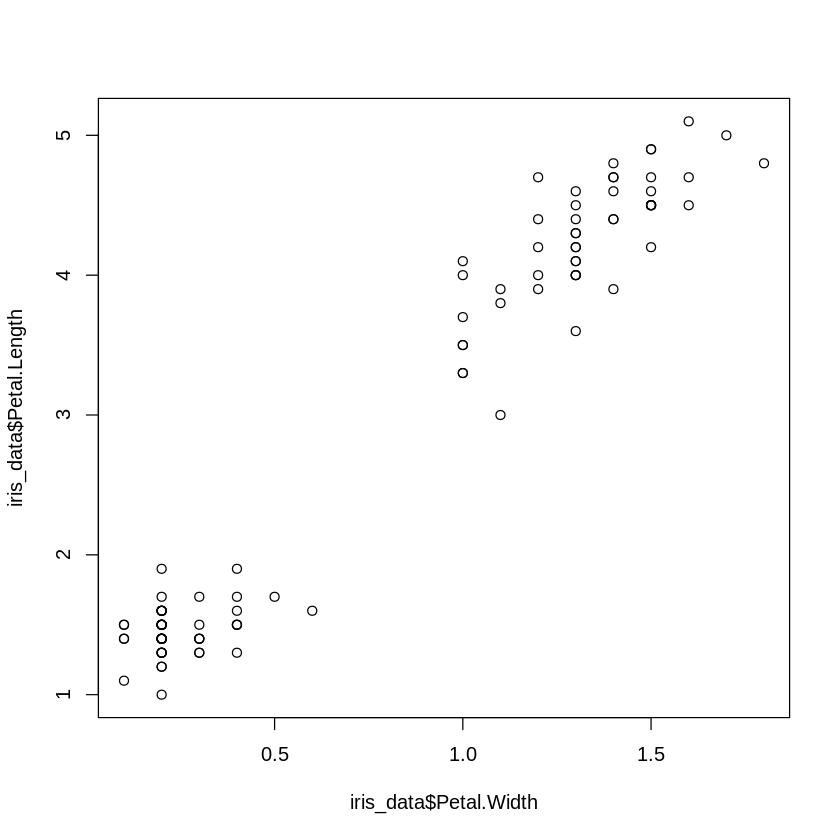

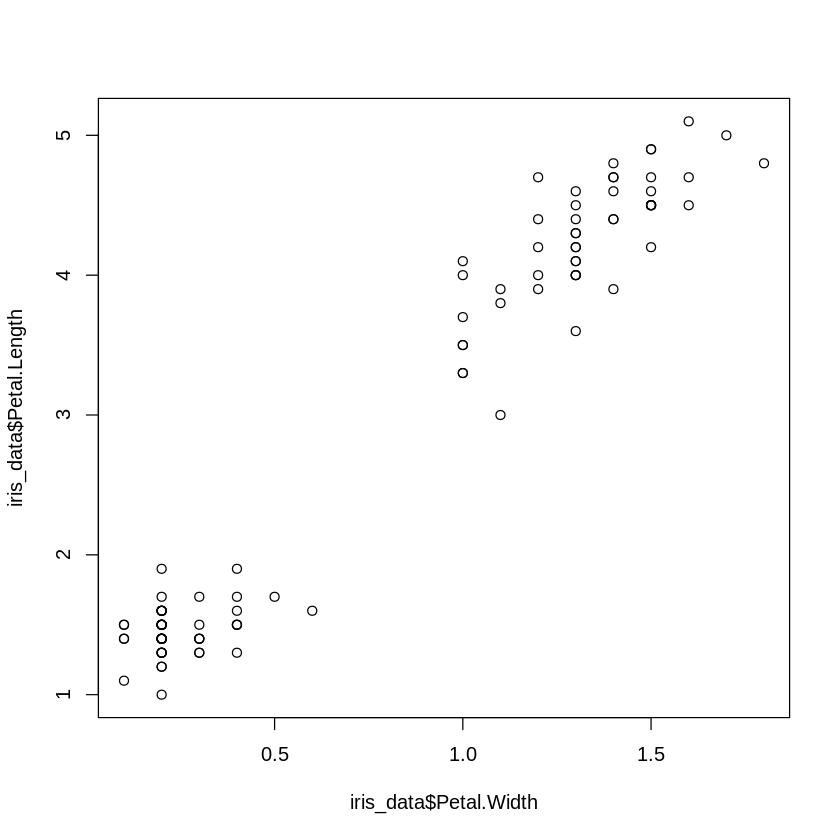

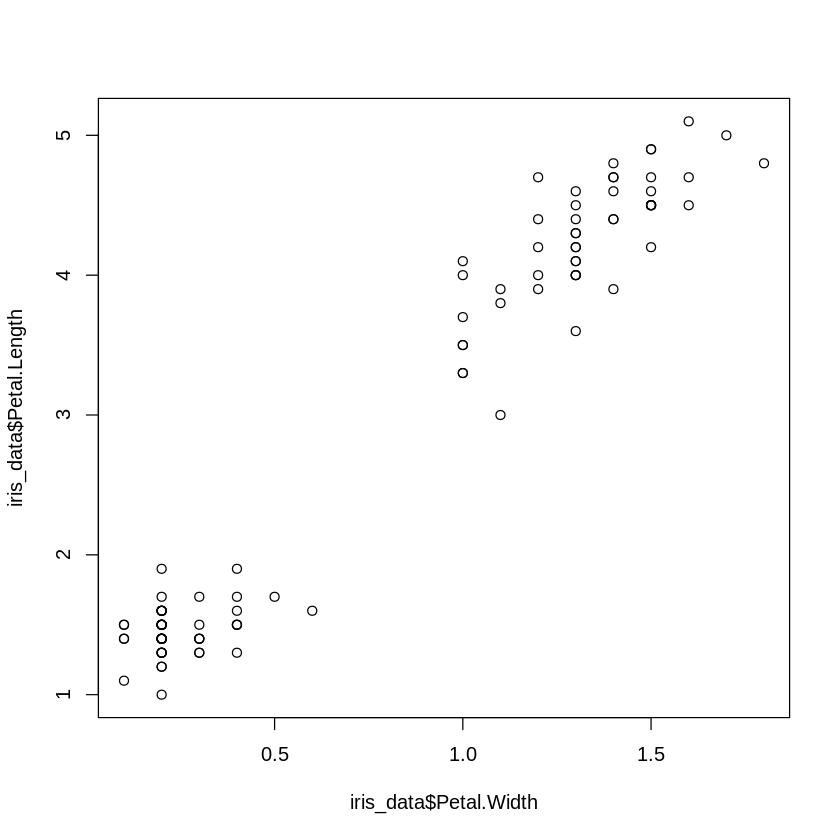

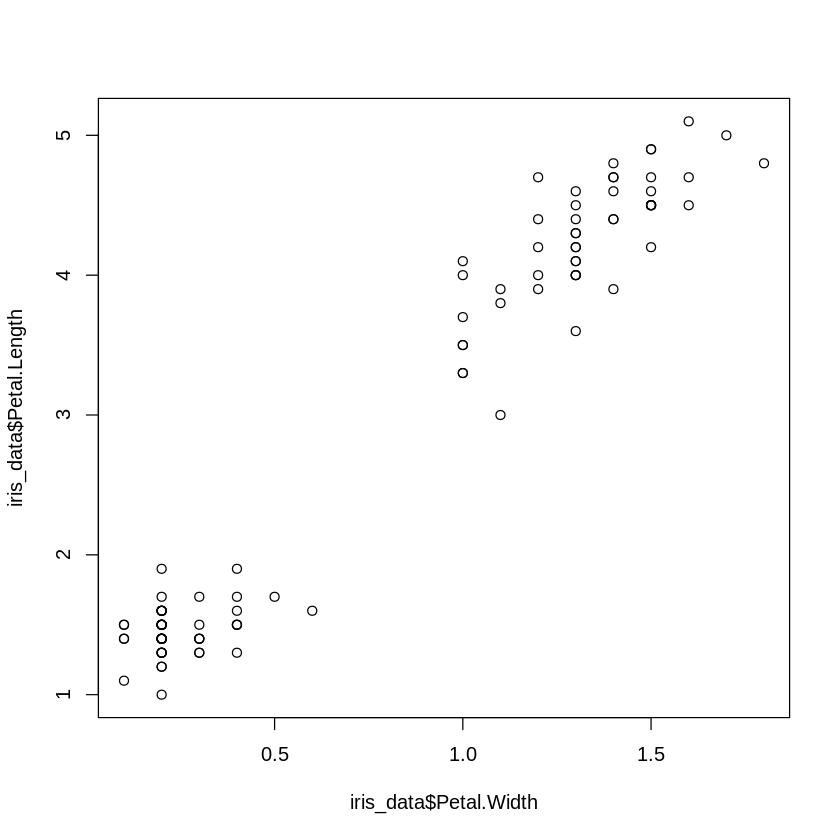

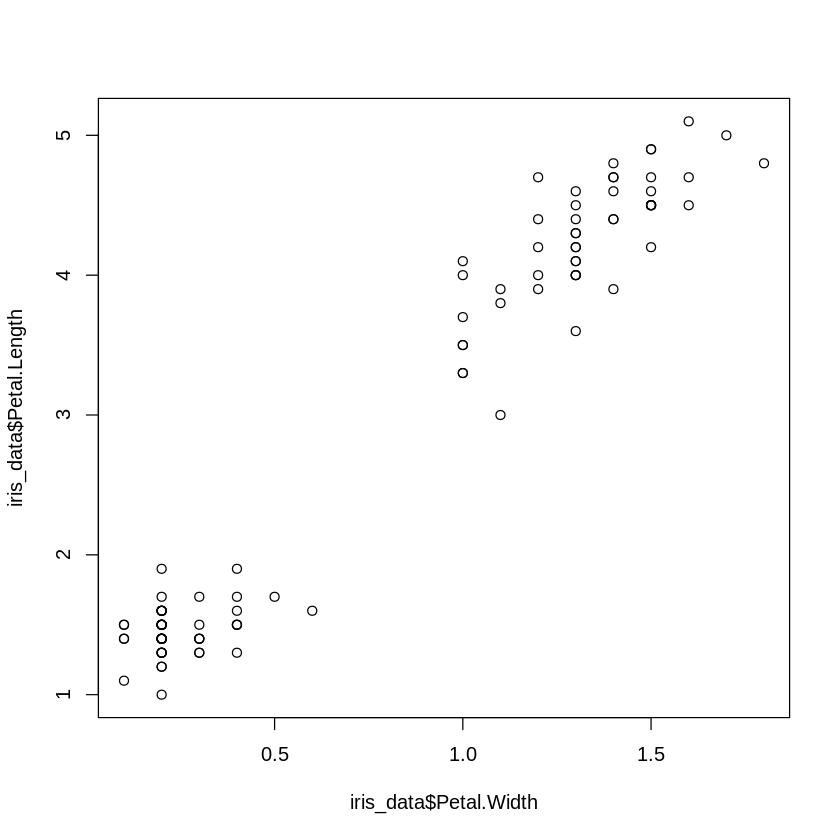

...

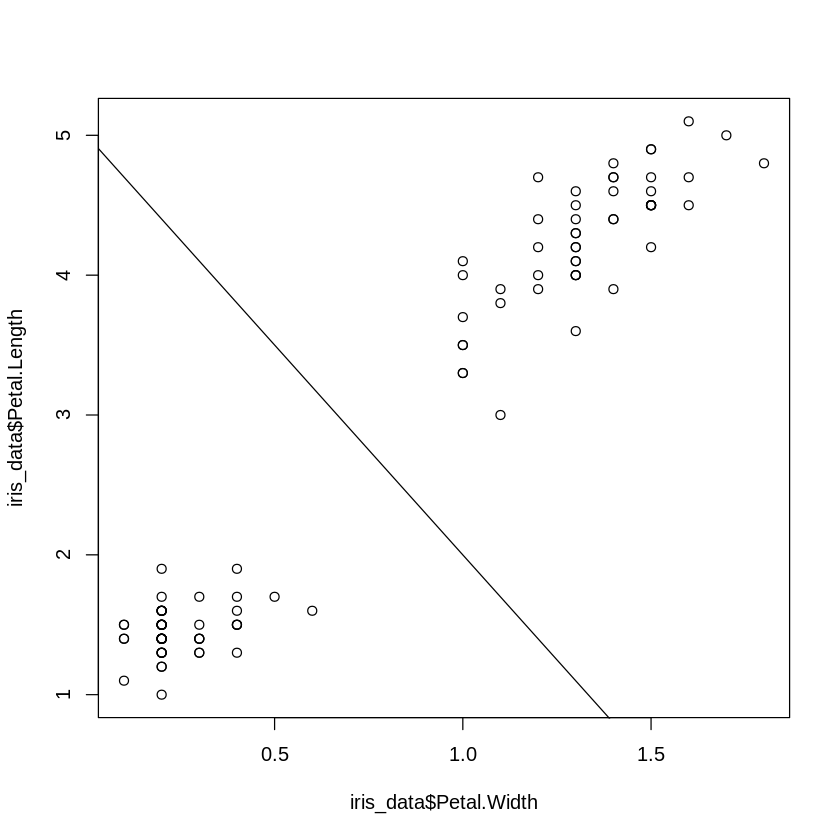

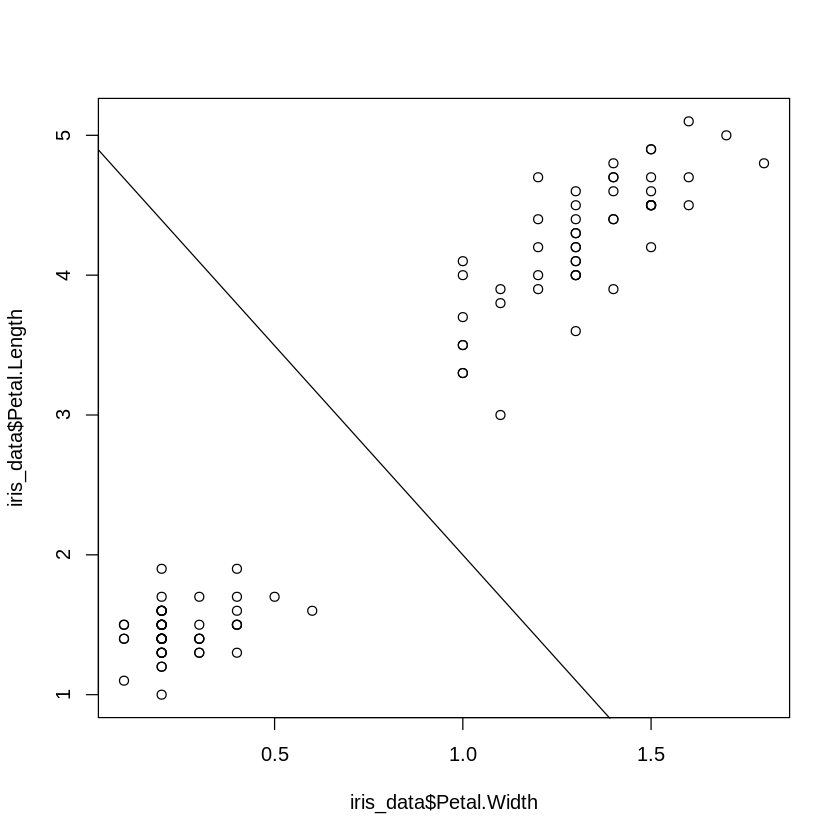

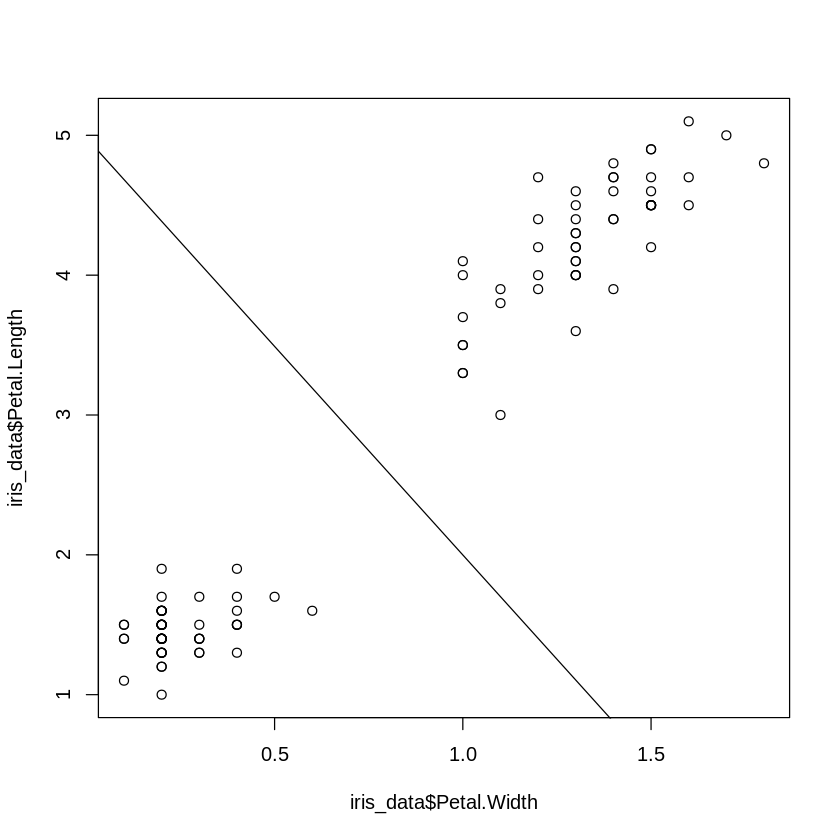

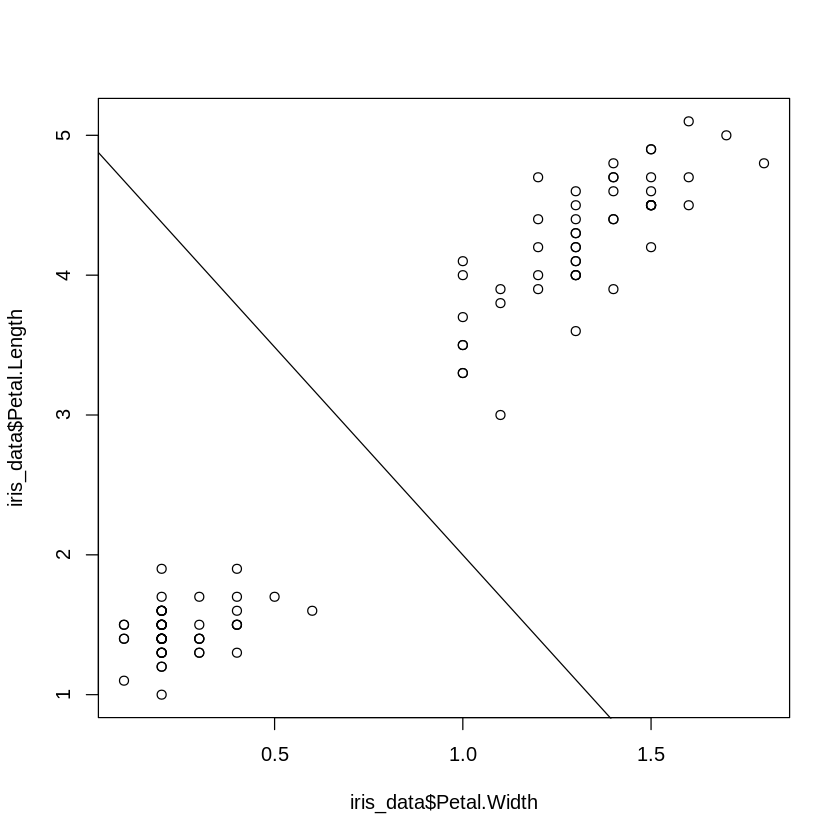

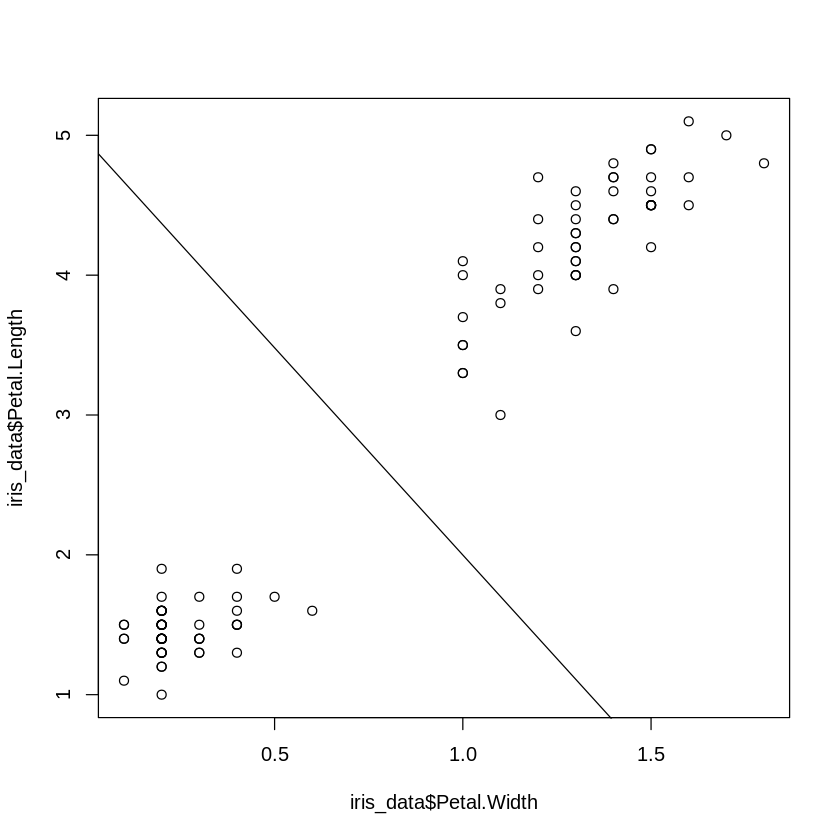

intercept,0.8244946
Petal.Length,-0.4918100
Petal.Width,-0.1664663


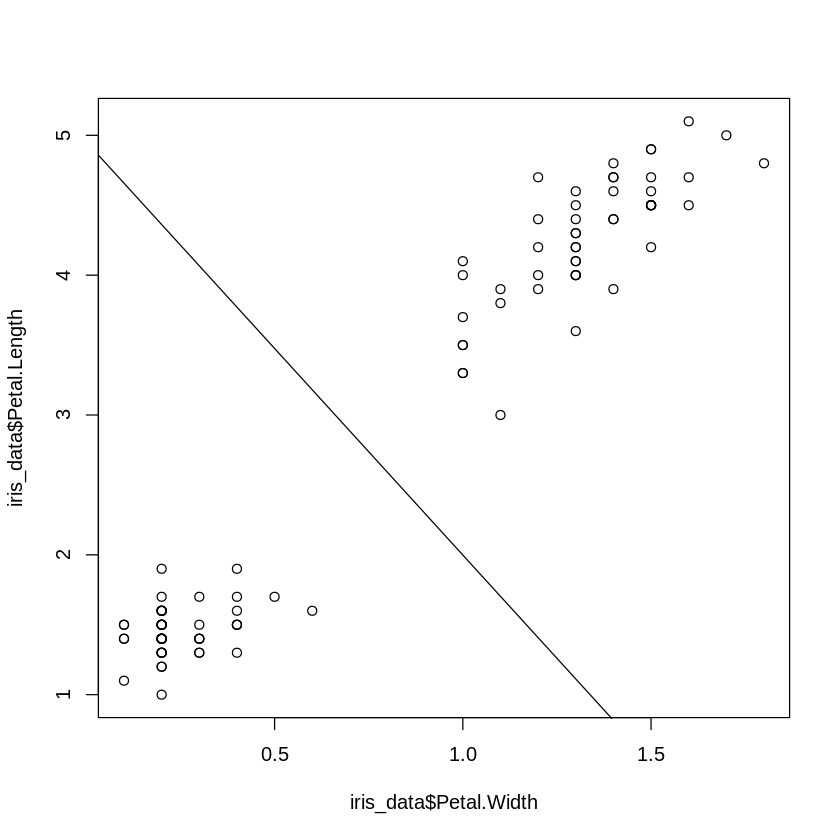

In [15]:
## gradient descent intuition
##
#   gradient = theta - d (cost)/ d theta   
# (the derivative i.e. change in cost wrt theta tells at what dtheta (smallest change in 
# weight/ theta) the change in cost is MAXIMUM. if each partial derivate is a scalar
# the answer is a simple scalar quantity, 
# but if they are vectors (dot product of 2 vectors
# return a scalar) then if the point is in same direction then quantity is maximized
# this shows that gradient always points in direction of steepest ascent.
# |a|.|b| = ab cos(theta) [dot product of 2 vectors]
# quantity is maximum when cos(theta) = 1, theta = 0
#
# why gradient points in the direction of steepest ascent
# https://math.stackexchange.com/questions/223252/why-is-gradient-the-direction-of-steepest-ascent
# we go in the reverse direction for descent
#
# similarly, the partial derivative of a function f() is the slope of the line 
# tangent to the curve made by function f() at a paritcular point.
# now the increase in cost will be maximum if the next point is in the direction of 
# increasing slope, and if we go in reverse direction the cost will decrease by maximum
# 


cost = c()
gradient_descent_for_logloss = function(alpha, iterations, initial_theta, train_x, train_y)
{
  ## initialize theta (weights)
  theta = initial_theta
  for(i in seq(1, iterations)){

  z1 = train_x %*% c(t(theta))
  
  ## apply activation
  hthetax = mapply(sigmoid, rowSums(z1))
  
  ## calculating cost J(theta)
  cost <<- c(cost, logloss_cost(train_y, hthetax))
  
  ## gradient calculation
  ## using derivative of cost function J(theta)
  theta_iter = alpha/nrow(train_x) * (t(train_x) %*% c(hthetax - train_y))
  
  ## gradient update
  theta = theta - theta_iter
  
  slope = theta[2]/(-theta[3])
  intercept = theta[1]/(-theta[3]) 
  plot(iris_data$Petal.Width, iris_data$Petal.Length)
  abline(intercept, slope)
  Sys.sleep(0)
  
  }
  return(theta)
  
}
alpha = 0.01
## keep changing epochs, more epochs = more steps towards minimum cost
epochs = 600

thetas = gradient_descent_for_logloss(alpha, epochs, as.matrix(c(0, 0.5, 0.5), 1), train_x, train_y)

thetas
## check how the decision boundary changes with each step of gradient descent

In [18]:
################################################

## predicting using theta values
z_op = test_x %*% c(t(thetas))

pred_prob = mapply(sigmoid, z_op)

preds = ifelse(pred_prob > 0.5, 1, 0)

caret::confusionMatrix(as.factor(preds), as.factor(test_y))
## ~ 96% accuracy
  

Confusion Matrix and Statistics

          Reference
Prediction  0  1
         0 15  4
         1  0 11
                                          
               Accuracy : 0.8667          
                 95% CI : (0.6928, 0.9624)
    No Information Rate : 0.5             
    P-Value [Acc > NIR] : 2.974e-05       
                                          
                  Kappa : 0.7333          
 Mcnemar's Test P-Value : 0.1336          
                                          
            Sensitivity : 1.0000          
            Specificity : 0.7333          
         Pos Pred Value : 0.7895          
         Neg Pred Value : 1.0000          
             Prevalence : 0.5000          
         Detection Rate : 0.5000          
   Detection Prevalence : 0.6333          
      Balanced Accuracy : 0.8667          
                                          
       'Positive' Class : 0               
                                          